<a href="https://colab.research.google.com/github/praveenraghuvanshi1512/janatahack/blob/master/src/AV_jantahackathon_CV_V8_95_0.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Analytics Vidya Hackathon Computer Vision June-2020

Link: https://datahack.analyticsvidhya.com/contest/janatahack-computer-vision-hackathon/

Team:
- Praveen Raghuvanshi
- Suman Kanukollu

### References
- [How to Train an Image Classifier in PyTorch and use it to Perform Basic Inference on Single Images](
https://towardsdatascience.com/how-to-train-an-image-classifier-in-pytorch-and-use-it-to-perform-basic-inference-on-single-images-99465a1e9bf5)



# Setup

In [1]:
import torch
from IPython.display import Image, clear_output 

print('PyTorch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

PyTorch 1.5.0+cu101 _CudaDeviceProperties(name='Tesla P100-PCIE-16GB', major=6, minor=0, total_memory=16280MB, multi_processor_count=56)


In [2]:
# Load data from Google drive
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [3]:
import sys,os

homepath = '/content/drive/My Drive/jantahackathon/data'
os.chdir(homepath)

!ls

full	jantahackathon.pth     sample_2.csv   test	train.csv
images	jantahackathon_v8.pth  sample_v8.csv  test.csv	train_SOaYf6m.zip


# Install Extensions

In [4]:
!pip install -U git+https://github.com/albu/albumentations --no-cache-dir

  Cloning https://github.com/albu/albumentations to /tmp/pip-req-build-hbhismk1
  Running command git clone -q https://github.com/albu/albumentations /tmp/pip-req-build-hbhismk1
     |████████████████████████████████| 634kB 8.9MB/s 
  Created wheel for albumentations: filename=albumentations-0.4.5-cp36-none-any.whl size=65173 sha256=b9671943c656ff0207947d086351c7b49cf5bc3690023a3e453797c9d44d767f
  Stored in directory: /tmp/pip-ephem-wheel-cache-sw1wqgbt/wheels/45/8b/e4/2837bbcf517d00732b8e394f8646f22b8723ac00993230188b
  Created wheel for imgaug: filename=imgaug-0.2.6-cp36-none-any.whl size=654020 sha256=e6f81d44a9fdcc10c812221bcd26da38fce69e1f8bb040e831330eaef39dcee6
  Stored in directory: /tmp/pip-ephem-wheel-cache-sw1wqgbt/wheels/97/ec/48/0d25896c417b715af6236dbcef8f0bed136a1a5e52972fc6d0
Successfully built albumentations imgaug
  Found existing installation: imgaug 0.2.9
    Uninstalling imgaug-0.2.9:
      Successfully uninstalled imgaug-0.2.9
  Found existing installation: album

In [5]:
!pip install ipython-autotime
%load_ext autotime

  Created wheel for ipython-autotime: filename=ipython_autotime-0.1-cp36-none-any.whl size=1832 sha256=eaca80ee38ef0ba72d2c440d9609a48350aae6134d826dcae05ad72a3b7ca838
  Stored in directory: /root/.cache/pip/wheels/d2/df/81/2db1e54bc91002cec40334629bc39cfa86dff540b304ebcd6e
Successfully built ipython-autotime


# Constants, import libraries

In [6]:
import torch,torchvision
from torchvision.datasets import ImageFolder
from PIL import Image

import pandas as pd
import numpy as np


time: 338 ms


# Albumentations

In [8]:
import albumentations as alb
from albumentations.pytorch import ToTensor
class album_compose_train:
    def __init__(self):
        #meandata, stddata=album_calculate_dataset_mean_std()
        mean_color=(0.4804, 0.4482, 0.3976)
        #channel_mean=(meandata[0]+meandata[1]+meandata[2])/3.0
        #print('channel mean',channel_mean)
        self.albtransform = alb.Compose([
                #alb.PadIfNeeded(min_height=80, min_width=80, border_mode=cv2.BORDER_CONSTANT, value=np.array(mean_color)*255),
                #alb.RandomCrop(64,64,always_apply=True),
                alb.Rotate((-15.0,15.0)),
                #alb.ToGray(),
                #alb.RandomBrightnessContrast(),
                alb.HorizontalFlip(p=0.5),
                #alb.RandomResizedCrop(64, 64, scale=(0.75, 1.0), ratio=(0.9, 1.1), p=0.75),
                #alb.Cutout(num_holes=1, max_h_size=12, max_w_size=12, fill_value=[0.4914, 0.4822, 0.4465], always_apply=False, p=0.5),
                #alb.CoarseDropout(max_holes=8, max_height=16, max_width=16, min_holes=1, min_height=8, min_width=8,fill_value=0, p=1.0),
                #alb.Normalize((0.4804, 0.4482, 0.3976), (0.277, 0.269, 0.282)),
                ToTensor(),
        ])
 
    def __call__(self,img):
        img=np.array(img)
        img=self.albtransform(image=img)
        return img['image']

class album_compose_test:
    def __init__(self):
        #meandata, stddata=album_calculate_dataset_mean_std()
        self.albtransform = alb.Compose([
        
        #print('meandata[0]:',meandata[0]),
        alb.Normalize((0.4804, 0.4482, 0.3976), (0.277, 0.269, 0.282)),
        ToTensor(),
        ])
 
    def __call__(self,img):
        img=np.array(img)
        img=self.albtransform(image=img)
        return img['image']



time: 10.2 ms


# Dataset read

In [9]:
class emgNemgDs(torch.utils.data.Dataset,album_compose_train,album_compose_test):
    def __init__(self,train=True):
        self.path,self.trainFn, self.testFn = os.path.join(homepath,'images'),'train.csv','test.csv'
        self.train = train
        if self.train:
            self.ds = pd.read_csv('train.csv').to_numpy()
        else:
            self.ds  = pd.read_csv('test.csv').to_numpy()
        self.transform = album_compose_train()
        #self.testnames = []

    def __len__(self):
        return len(self.ds)

    def __getitem__(self, idx):
        img_name = os.path.join(self.path, self.ds[idx][0])
        image = Image.open(img_name)
        image = self.transform(image)
        if self.train:
            labels = self.ds[idx][1]
            return image,labels
        else:
            #self.testnames.append(img_name)
            #self.testDict = {'image_names':self.testnames ,'emergency_or_not':[]}
            return image

        

time: 10.1 ms


In [10]:
trainDs = emgNemgDs(train=True)
testDs  = emgNemgDs(train=False)
print('Train DS length is : {}\nTest DS length is : {}'.format(len(trainDs),len(testDs)))


Train DS length is : 1646
Test DS length is : 706
time: 1.43 s


In [11]:
from torch.utils.data import random_split
train_ds,val_ds = random_split(trainDs,[1235,411])

print('Dataset is splitted into 75%+25%:\n\ttrain_ds len is : {}\n\tval_ds len is : {}'.format(len(train_ds),len(val_ds)))

Dataset is splitted into 75%+25%:
	train_ds len is : 1235
	val_ds len is : 411
time: 26.8 ms


# Dataloader

In [12]:
from torch.utils.data import DataLoader,random_split

SEED = 1
# For reproducibility
torch.manual_seed(SEED)

torch.cuda.manual_seed(SEED)

train_loader = DataLoader(train_ds, batch_size = 16, shuffle =True, pin_memory=True,num_workers =0)
val_loader  = DataLoader(val_ds, batch_size = 8, shuffle =False, pin_memory=True,num_workers =0)

test_loader = DataLoader(testDs,batch_size = 8, shuffle =False, pin_memory=True,num_workers =0)

time: 3.31 ms


# Display images

In [13]:
import torchvision
from matplotlib import pyplot as plt

def show(imgs,lbls=None, figsize=(100,100), *args, **kwargs):
    grid_tensor = torchvision.utils.make_grid(imgs[:8], *args, **kwargs)
    grid_image = grid_tensor.permute(1,2,0)
    plt.figtext(100,100,'suman')
    plt.figure(figsize=figsize)
    plt.imshow(grid_image)
    plt.xticks([])
    plt.yticks([])
    plt.show()
    if lbls is not None:
        print(' '.join('%22s' % [lbls[j]] for j in range(8)))
    plt.close()


time: 9.73 ms


<Figure size 432x288 with 0 Axes>

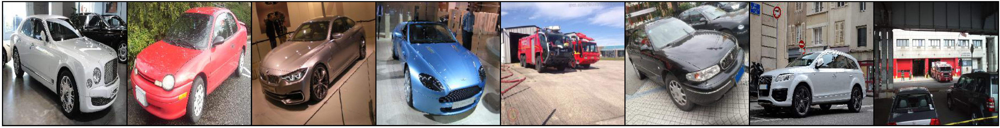

           [tensor(0)]            [tensor(0)]            [tensor(0)]            [tensor(0)]            [tensor(1)]            [tensor(0)]            [tensor(0)]            [tensor(1)]
time: 19.3 s


In [14]:
dataiter = iter(train_loader)
img,lbl = dataiter.next()

show(img,lbl)

<Figure size 432x288 with 0 Axes>

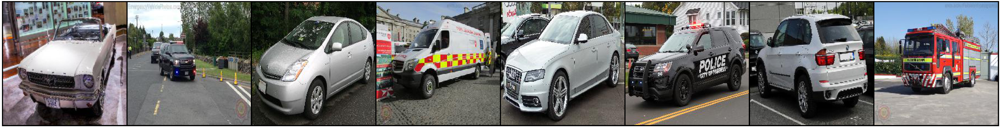

time: 5.01 s


In [15]:
dataiter = iter(test_loader)
img = dataiter.next()

show(img)

In [15]:
'''# Constants
TEST_CSV = '/content/drive/My Drive/jantahackathon/data/test_vc2kHdQ.csv'

TRAIN_CSV = '/content/drive/My Drive/jantahackathon/data/train.csv'
TOTAL_IMAGES_PATH = '/content/drive/My Drive/jantahackathon/data/full'
TOTAL_IMAGES_EMERGENCY_PATH = '/content/drive/My Drive/jantahackathon/data/full/emergency'
TOTAL_IMAGES_NOT_EMERGENCY_PATH = '/content/drive/My Drive/jantahackathon/data/full/notemergency'
TRAIN_ZIP = '/content/drive/My Drive/jantahackathon/data/train_SOaYf6m.zip'
ALL_IMAGES_PATH = '/content/drive/My Drive/jantahackathon/data/images'

import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import torch

from skimage.io import imread
from tqdm import tqdm

%matplotlib inline

# for creating validation set
from sklearn.model_selection import train_test_split

# PyTorch libraries and modules
import torch
from torch.autograd import Variable
from torch.nn import Linear, ReLU, CrossEntropyLoss, Sequential, Conv2d, MaxPool2d, Module, Softmax, BatchNorm2d, Dropout
from torch.optim import Adam, SGD
from torch import nn
from torch import optim
import torch.nn.functional as F
import torchvision
from torchvision import datasets, transforms, models
from torch.utils.data.sampler import SubsetRandomSampler

print(len(os.listdir(TOTAL_IMAGES_EMERGENCY_PATH)))
print(len(os.listdir(TOTAL_IMAGES_NOT_EMERGENCY_PATH)))
'''

"# Constants\nTEST_CSV = '/content/drive/My Drive/jantahackathon/data/test_vc2kHdQ.csv'\n\nTRAIN_CSV = '/content/drive/My Drive/jantahackathon/data/train.csv'\nTOTAL_IMAGES_PATH = '/content/drive/My Drive/jantahackathon/data/full'\nTOTAL_IMAGES_EMERGENCY_PATH = '/content/drive/My Drive/jantahackathon/data/full/emergency'\nTOTAL_IMAGES_NOT_EMERGENCY_PATH = '/content/drive/My Drive/jantahackathon/data/full/notemergency'\nTRAIN_ZIP = '/content/drive/My Drive/jantahackathon/data/train_SOaYf6m.zip'\nALL_IMAGES_PATH = '/content/drive/My Drive/jantahackathon/data/images'\n\nimport os\nimport pandas as pd\nimport numpy as np\nimport matplotlib.pyplot as plt\nimport torch\n\nfrom skimage.io import imread\nfrom tqdm import tqdm\n\n%matplotlib inline\n\n# for creating validation set\nfrom sklearn.model_selection import train_test_split\n\n# PyTorch libraries and modules\nimport torch\nfrom torch.autograd import Variable\nfrom torch.nn import Linear, ReLU, CrossEntropyLoss, Sequential, Conv2d, Max

time: 7.01 ms


# Model

In [16]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = torchvision.models.resnet50(pretrained=True)
print(model)

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/checkpoints/resnet50-19c8e357.pth



ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1,

### Freeze and modify final layer

In [17]:
for param in model.parameters():
    param.requires_grad = False
    

model.fc = torch.nn.Sequential(torch.nn.Linear(2048, 512),
                            torch.nn.ReLU(),
                            torch.nn.Dropout(0.2),
                            torch.nn.Linear(512, 2),
                            torch.nn.LogSoftmax(dim=1))

time: 12.8 ms


## Loss and Optimizer

In [18]:
criterion = torch.nn.CrossEntropyLoss() # torch.nn.NLLLoss()
optimizer = torch.optim.SGD(model.parameters(), lr=0.01) # torch.optim.Adam(model.fc.parameters(), lr=0.003)
model.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

time: 80.7 ms


# Train Model

In [19]:
from tqdm import tqdm

epochs = 20
steps = 0
running_loss = 0
best_accuracy = 0
print_every = 10
train_losses, test_losses = [], []
for epoch in tqdm(range(epochs)):
    for inputs, labels in train_loader:
        steps += 1
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()
        logps = model.forward(inputs)
        loss = criterion(logps, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        
        if steps % print_every == 0:
            test_loss = 0
            accuracy = 0
            model.eval()
            with torch.no_grad():
                for inputs, labels in val_loader:
                    inputs, labels = inputs.to(device), labels.to(device)
                    logps = model.forward(inputs)
                    batch_loss = criterion(logps, labels)
                    test_loss += batch_loss.item()
                    
                    ps = torch.exp(logps)
                    top_p, top_class = ps.topk(1, dim=1)
                    equals = top_class == labels.view(*top_class.shape)
                    accuracy += torch.mean(equals.type(torch.FloatTensor)).item()
            train_losses.append(running_loss/len(train_loader))
            test_losses.append(test_loss/len(val_loader))     
            test_accuracy = accuracy/len(val_loader)               
            print(f"Epoch {epoch+1}/{epochs}.. "
                  f"Train loss: {running_loss/print_every:.3f}.. "
                  f"Test loss: {test_loss/len(val_loader):.3f}.. "
                  f"Test accuracy: {accuracy/len(val_loader):.3f}")
            running_loss = 0

            # Save best model
            if test_accuracy > best_accuracy:
              best_accuracy = test_accuracy
              print(f'Saving best model with accuracy: {best_accuracy:.3f}')
              torch.save(model, 'jantahackathon_v8.pth')
            model.train()

print(f'****** Best model with Accuracy : {best_accuracy:.3f}')

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1/20.. Train loss: 0.669.. Test loss: 0.613.. Test accuracy: 0.595
Saving best model with accuracy: 0.595
Epoch 1/20.. Train loss: 0.611.. Test loss: 0.604.. Test accuracy: 0.595
Epoch 1/20.. Train loss: 0.562.. Test loss: 0.517.. Test accuracy: 0.885
Saving best model with accuracy: 0.885
Epoch 1/20.. Train loss: 0.536.. Test loss: 0.501.. Test accuracy: 0.851
Epoch 1/20.. Train loss: 0.485.. Test loss: 0.426.. Test accuracy: 0.894
Saving best model with accuracy: 0.894
Epoch 1/20.. Train loss: 0.482.. Test loss: 0.393.. Test accuracy: 0.899
Saving best model with accuracy: 0.899
Epoch 1/20.. Train loss: 0.416.. Test loss: 0.366.. Test accuracy: 0.894


  5%|▌         | 1/20 [12:39<4:00:23, 759.11s/it]

Epoch 2/20.. Train loss: 0.389.. Test loss: 0.338.. Test accuracy: 0.894
Epoch 2/20.. Train loss: 0.362.. Test loss: 0.397.. Test accuracy: 0.837
Epoch 2/20.. Train loss: 0.365.. Test loss: 0.304.. Test accuracy: 0.916
Saving best model with accuracy: 0.916
Epoch 2/20.. Train loss: 0.298.. Test loss: 0.287.. Test accuracy: 0.897
Epoch 2/20.. Train loss: 0.344.. Test loss: 0.307.. Test accuracy: 0.877
Epoch 2/20.. Train loss: 0.338.. Test loss: 0.321.. Test accuracy: 0.870
Epoch 2/20.. Train loss: 0.355.. Test loss: 0.262.. Test accuracy: 0.897
Epoch 2/20.. Train loss: 0.267.. Test loss: 0.246.. Test accuracy: 0.911


 10%|█         | 2/20 [13:03<2:41:34, 538.59s/it]

Epoch 3/20.. Train loss: 0.419.. Test loss: 0.255.. Test accuracy: 0.916
Epoch 3/20.. Train loss: 0.280.. Test loss: 0.240.. Test accuracy: 0.909
Epoch 3/20.. Train loss: 0.305.. Test loss: 0.231.. Test accuracy: 0.925
Saving best model with accuracy: 0.925
Epoch 3/20.. Train loss: 0.380.. Test loss: 0.285.. Test accuracy: 0.880
Epoch 3/20.. Train loss: 0.312.. Test loss: 0.244.. Test accuracy: 0.906
Epoch 3/20.. Train loss: 0.222.. Test loss: 0.228.. Test accuracy: 0.911
Epoch 3/20.. Train loss: 0.249.. Test loss: 0.277.. Test accuracy: 0.895
Epoch 3/20.. Train loss: 0.330.. Test loss: 0.237.. Test accuracy: 0.906


 15%|█▌        | 3/20 [13:26<1:48:47, 383.95s/it]

Epoch 4/20.. Train loss: 0.290.. Test loss: 0.230.. Test accuracy: 0.909
Epoch 4/20.. Train loss: 0.272.. Test loss: 0.216.. Test accuracy: 0.911
Epoch 4/20.. Train loss: 0.235.. Test loss: 0.214.. Test accuracy: 0.923
Epoch 4/20.. Train loss: 0.294.. Test loss: 0.220.. Test accuracy: 0.916
Epoch 4/20.. Train loss: 0.314.. Test loss: 0.271.. Test accuracy: 0.892
Epoch 4/20.. Train loss: 0.265.. Test loss: 0.212.. Test accuracy: 0.913
Epoch 4/20.. Train loss: 0.315.. Test loss: 0.244.. Test accuracy: 0.889


 20%|██        | 4/20 [13:48<1:13:28, 275.50s/it]

Epoch 4/20.. Train loss: 0.255.. Test loss: 0.223.. Test accuracy: 0.913
Epoch 5/20.. Train loss: 0.313.. Test loss: 0.230.. Test accuracy: 0.913
Epoch 5/20.. Train loss: 0.223.. Test loss: 0.206.. Test accuracy: 0.906
Epoch 5/20.. Train loss: 0.234.. Test loss: 0.215.. Test accuracy: 0.909
Epoch 5/20.. Train loss: 0.239.. Test loss: 0.263.. Test accuracy: 0.875
Epoch 5/20.. Train loss: 0.255.. Test loss: 0.231.. Test accuracy: 0.892
Epoch 5/20.. Train loss: 0.220.. Test loss: 0.192.. Test accuracy: 0.928
Saving best model with accuracy: 0.928
Epoch 5/20.. Train loss: 0.370.. Test loss: 0.217.. Test accuracy: 0.906


 25%|██▌       | 5/20 [14:11<49:55, 199.72s/it]  

Epoch 5/20.. Train loss: 0.188.. Test loss: 0.202.. Test accuracy: 0.916
Epoch 6/20.. Train loss: 0.279.. Test loss: 0.252.. Test accuracy: 0.892
Epoch 6/20.. Train loss: 0.244.. Test loss: 0.194.. Test accuracy: 0.928
Epoch 6/20.. Train loss: 0.267.. Test loss: 0.197.. Test accuracy: 0.923
Epoch 6/20.. Train loss: 0.184.. Test loss: 0.215.. Test accuracy: 0.921
Epoch 6/20.. Train loss: 0.256.. Test loss: 0.229.. Test accuracy: 0.904
Epoch 6/20.. Train loss: 0.293.. Test loss: 0.186.. Test accuracy: 0.933
Saving best model with accuracy: 0.933
Epoch 6/20.. Train loss: 0.319.. Test loss: 0.252.. Test accuracy: 0.906


 30%|███       | 6/20 [14:32<34:05, 146.07s/it]

Epoch 7/20.. Train loss: 0.211.. Test loss: 0.209.. Test accuracy: 0.921
Epoch 7/20.. Train loss: 0.290.. Test loss: 0.202.. Test accuracy: 0.935
Saving best model with accuracy: 0.935
Epoch 7/20.. Train loss: 0.171.. Test loss: 0.210.. Test accuracy: 0.921
Epoch 7/20.. Train loss: 0.171.. Test loss: 0.196.. Test accuracy: 0.913
Epoch 7/20.. Train loss: 0.260.. Test loss: 0.197.. Test accuracy: 0.921
Epoch 7/20.. Train loss: 0.250.. Test loss: 0.206.. Test accuracy: 0.930
Epoch 7/20.. Train loss: 0.246.. Test loss: 0.328.. Test accuracy: 0.853
Epoch 7/20.. Train loss: 0.158.. Test loss: 0.224.. Test accuracy: 0.897


 35%|███▌      | 7/20 [14:55<23:39, 109.17s/it]

Epoch 8/20.. Train loss: 0.250.. Test loss: 0.194.. Test accuracy: 0.918
Epoch 8/20.. Train loss: 0.188.. Test loss: 0.205.. Test accuracy: 0.916
Epoch 8/20.. Train loss: 0.243.. Test loss: 0.197.. Test accuracy: 0.921
Epoch 8/20.. Train loss: 0.201.. Test loss: 0.205.. Test accuracy: 0.911
Epoch 8/20.. Train loss: 0.149.. Test loss: 0.177.. Test accuracy: 0.938
Saving best model with accuracy: 0.938
Epoch 8/20.. Train loss: 0.262.. Test loss: 0.200.. Test accuracy: 0.913
Epoch 8/20.. Train loss: 0.176.. Test loss: 0.207.. Test accuracy: 0.911
Epoch 8/20.. Train loss: 0.257.. Test loss: 0.201.. Test accuracy: 0.925


 40%|████      | 8/20 [15:18<16:38, 83.22s/it] 

Epoch 9/20.. Train loss: 0.235.. Test loss: 0.176.. Test accuracy: 0.938
Epoch 9/20.. Train loss: 0.197.. Test loss: 0.190.. Test accuracy: 0.916
Epoch 9/20.. Train loss: 0.302.. Test loss: 0.210.. Test accuracy: 0.921
Epoch 9/20.. Train loss: 0.140.. Test loss: 0.209.. Test accuracy: 0.911
Epoch 9/20.. Train loss: 0.195.. Test loss: 0.197.. Test accuracy: 0.913
Epoch 9/20.. Train loss: 0.243.. Test loss: 0.193.. Test accuracy: 0.921
Epoch 9/20.. Train loss: 0.261.. Test loss: 0.175.. Test accuracy: 0.938


 45%|████▌     | 9/20 [15:40<11:55, 65.03s/it]

Epoch 9/20.. Train loss: 0.222.. Test loss: 0.276.. Test accuracy: 0.889
Epoch 10/20.. Train loss: 0.220.. Test loss: 0.189.. Test accuracy: 0.930
Epoch 10/20.. Train loss: 0.173.. Test loss: 0.357.. Test accuracy: 0.839
Epoch 10/20.. Train loss: 0.253.. Test loss: 0.288.. Test accuracy: 0.875
Epoch 10/20.. Train loss: 0.298.. Test loss: 0.241.. Test accuracy: 0.897
Epoch 10/20.. Train loss: 0.274.. Test loss: 0.259.. Test accuracy: 0.882
Epoch 10/20.. Train loss: 0.326.. Test loss: 0.202.. Test accuracy: 0.916
Epoch 10/20.. Train loss: 0.236.. Test loss: 0.170.. Test accuracy: 0.942
Saving best model with accuracy: 0.942


 50%|█████     | 10/20 [16:03<08:43, 52.31s/it]

Epoch 10/20.. Train loss: 0.217.. Test loss: 0.245.. Test accuracy: 0.899
Epoch 11/20.. Train loss: 0.191.. Test loss: 0.203.. Test accuracy: 0.918
Epoch 11/20.. Train loss: 0.248.. Test loss: 0.186.. Test accuracy: 0.918
Epoch 11/20.. Train loss: 0.164.. Test loss: 0.183.. Test accuracy: 0.923
Epoch 11/20.. Train loss: 0.245.. Test loss: 0.187.. Test accuracy: 0.918
Epoch 11/20.. Train loss: 0.227.. Test loss: 0.181.. Test accuracy: 0.930
Epoch 11/20.. Train loss: 0.362.. Test loss: 0.193.. Test accuracy: 0.921
Epoch 11/20.. Train loss: 0.203.. Test loss: 0.187.. Test accuracy: 0.923


 55%|█████▌    | 11/20 [16:23<06:24, 42.73s/it]

Epoch 12/20.. Train loss: 0.184.. Test loss: 0.195.. Test accuracy: 0.923
Epoch 12/20.. Train loss: 0.212.. Test loss: 0.172.. Test accuracy: 0.935
Epoch 12/20.. Train loss: 0.236.. Test loss: 0.178.. Test accuracy: 0.930
Epoch 12/20.. Train loss: 0.206.. Test loss: 0.182.. Test accuracy: 0.930
Epoch 12/20.. Train loss: 0.232.. Test loss: 0.182.. Test accuracy: 0.930
Epoch 12/20.. Train loss: 0.118.. Test loss: 0.221.. Test accuracy: 0.909
Epoch 12/20.. Train loss: 0.239.. Test loss: 0.211.. Test accuracy: 0.921
Epoch 12/20.. Train loss: 0.203.. Test loss: 0.215.. Test accuracy: 0.911


 60%|██████    | 12/20 [16:46<04:52, 36.60s/it]

Epoch 13/20.. Train loss: 0.551.. Test loss: 0.174.. Test accuracy: 0.935
Epoch 13/20.. Train loss: 0.234.. Test loss: 0.202.. Test accuracy: 0.911
Epoch 13/20.. Train loss: 0.182.. Test loss: 0.203.. Test accuracy: 0.916
Epoch 13/20.. Train loss: 0.198.. Test loss: 0.174.. Test accuracy: 0.928
Epoch 13/20.. Train loss: 0.312.. Test loss: 0.186.. Test accuracy: 0.933
Epoch 13/20.. Train loss: 0.148.. Test loss: 0.180.. Test accuracy: 0.933
Epoch 13/20.. Train loss: 0.173.. Test loss: 0.174.. Test accuracy: 0.923
Epoch 13/20.. Train loss: 0.179.. Test loss: 0.187.. Test accuracy: 0.933


 65%|██████▌   | 13/20 [17:08<03:46, 32.32s/it]

Epoch 14/20.. Train loss: 0.261.. Test loss: 0.177.. Test accuracy: 0.935
Epoch 14/20.. Train loss: 0.265.. Test loss: 0.200.. Test accuracy: 0.921
Epoch 14/20.. Train loss: 0.218.. Test loss: 0.179.. Test accuracy: 0.933
Epoch 14/20.. Train loss: 0.269.. Test loss: 0.180.. Test accuracy: 0.930
Epoch 14/20.. Train loss: 0.171.. Test loss: 0.190.. Test accuracy: 0.933
Epoch 14/20.. Train loss: 0.190.. Test loss: 0.188.. Test accuracy: 0.930
Epoch 14/20.. Train loss: 0.204.. Test loss: 0.235.. Test accuracy: 0.899


 70%|███████   | 14/20 [17:31<02:56, 29.39s/it]

Epoch 14/20.. Train loss: 0.186.. Test loss: 0.172.. Test accuracy: 0.935
Epoch 15/20.. Train loss: 0.529.. Test loss: 0.189.. Test accuracy: 0.916
Epoch 15/20.. Train loss: 0.205.. Test loss: 0.223.. Test accuracy: 0.921
Epoch 15/20.. Train loss: 0.195.. Test loss: 0.180.. Test accuracy: 0.935
Epoch 15/20.. Train loss: 0.206.. Test loss: 0.192.. Test accuracy: 0.935
Epoch 15/20.. Train loss: 0.275.. Test loss: 0.198.. Test accuracy: 0.928
Epoch 15/20.. Train loss: 0.200.. Test loss: 0.175.. Test accuracy: 0.938
Epoch 15/20.. Train loss: 0.109.. Test loss: 0.172.. Test accuracy: 0.933


 75%|███████▌  | 15/20 [17:54<02:17, 27.52s/it]

Epoch 15/20.. Train loss: 0.233.. Test loss: 0.266.. Test accuracy: 0.892
Epoch 16/20.. Train loss: 0.204.. Test loss: 0.171.. Test accuracy: 0.935
Epoch 16/20.. Train loss: 0.160.. Test loss: 0.186.. Test accuracy: 0.928
Epoch 16/20.. Train loss: 0.216.. Test loss: 0.186.. Test accuracy: 0.923
Epoch 16/20.. Train loss: 0.170.. Test loss: 0.181.. Test accuracy: 0.930
Epoch 16/20.. Train loss: 0.157.. Test loss: 0.192.. Test accuracy: 0.933
Epoch 16/20.. Train loss: 0.171.. Test loss: 0.171.. Test accuracy: 0.940
Epoch 16/20.. Train loss: 0.151.. Test loss: 0.193.. Test accuracy: 0.925


 80%|████████  | 16/20 [18:14<01:41, 25.37s/it]

Epoch 17/20.. Train loss: 0.116.. Test loss: 0.214.. Test accuracy: 0.906
Epoch 17/20.. Train loss: 0.134.. Test loss: 0.184.. Test accuracy: 0.921
Epoch 17/20.. Train loss: 0.192.. Test loss: 0.194.. Test accuracy: 0.933
Epoch 17/20.. Train loss: 0.276.. Test loss: 0.188.. Test accuracy: 0.923
Epoch 17/20.. Train loss: 0.174.. Test loss: 0.285.. Test accuracy: 0.870
Epoch 17/20.. Train loss: 0.250.. Test loss: 0.209.. Test accuracy: 0.916
Epoch 17/20.. Train loss: 0.225.. Test loss: 0.178.. Test accuracy: 0.930
Epoch 17/20.. Train loss: 0.167.. Test loss: 0.167.. Test accuracy: 0.950
Saving best model with accuracy: 0.950


 85%|████████▌ | 17/20 [18:37<01:13, 24.56s/it]

Epoch 18/20.. Train loss: 0.275.. Test loss: 0.229.. Test accuracy: 0.911
Epoch 18/20.. Train loss: 0.210.. Test loss: 0.176.. Test accuracy: 0.935
Epoch 18/20.. Train loss: 0.200.. Test loss: 0.192.. Test accuracy: 0.938
Epoch 18/20.. Train loss: 0.227.. Test loss: 0.188.. Test accuracy: 0.925
Epoch 18/20.. Train loss: 0.201.. Test loss: 0.176.. Test accuracy: 0.925
Epoch 18/20.. Train loss: 0.183.. Test loss: 0.189.. Test accuracy: 0.933
Epoch 18/20.. Train loss: 0.213.. Test loss: 0.253.. Test accuracy: 0.907
Epoch 18/20.. Train loss: 0.280.. Test loss: 0.185.. Test accuracy: 0.933


 90%|█████████ | 18/20 [18:59<00:47, 23.92s/it]

Epoch 19/20.. Train loss: 0.300.. Test loss: 0.173.. Test accuracy: 0.940
Epoch 19/20.. Train loss: 0.196.. Test loss: 0.184.. Test accuracy: 0.928
Epoch 19/20.. Train loss: 0.163.. Test loss: 0.186.. Test accuracy: 0.916
Epoch 19/20.. Train loss: 0.182.. Test loss: 0.183.. Test accuracy: 0.925
Epoch 19/20.. Train loss: 0.349.. Test loss: 0.175.. Test accuracy: 0.930
Epoch 19/20.. Train loss: 0.230.. Test loss: 0.171.. Test accuracy: 0.928
Epoch 19/20.. Train loss: 0.301.. Test loss: 0.220.. Test accuracy: 0.916


 95%|█████████▌| 19/20 [19:21<00:23, 23.43s/it]

Epoch 19/20.. Train loss: 0.131.. Test loss: 0.180.. Test accuracy: 0.923
Epoch 20/20.. Train loss: 0.194.. Test loss: 0.168.. Test accuracy: 0.930
Epoch 20/20.. Train loss: 0.228.. Test loss: 0.185.. Test accuracy: 0.935
Epoch 20/20.. Train loss: 0.268.. Test loss: 0.178.. Test accuracy: 0.940
Epoch 20/20.. Train loss: 0.151.. Test loss: 0.190.. Test accuracy: 0.923
Epoch 20/20.. Train loss: 0.179.. Test loss: 0.173.. Test accuracy: 0.928
Epoch 20/20.. Train loss: 0.168.. Test loss: 0.182.. Test accuracy: 0.925
Epoch 20/20.. Train loss: 0.139.. Test loss: 0.186.. Test accuracy: 0.921


100%|██████████| 20/20 [19:44<00:00, 59.22s/it]

Epoch 20/20.. Train loss: 0.193.. Test loss: 0.265.. Test accuracy: 0.882
****** Best model with Accuracy : 0.950
time: 19min 44s


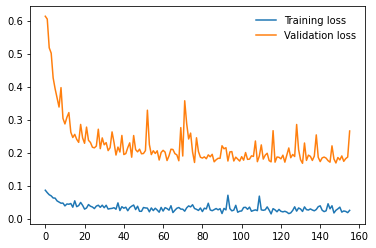

time: 158 ms


In [20]:
from matplotlib import pyplot as plt

plt.plot(train_losses, label='Training loss')
plt.plot(test_losses, label='Validation loss')
plt.legend(frameon=False)
plt.show()

# Load the saved model wts

In [21]:
#device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model=torch.load('jantahackathon_v8.pth')
model.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

time: 181 ms


In [22]:
from torchvision import transforms
test_transforms = transforms.Compose([transforms.ToTensor(),
                                      #transforms.Normalize([0.485, 0.456, 0.406],
                                      #                     [0.229, 0.224, 0.225])
                                     ])

time: 1.13 ms


In [23]:
from torch.autograd import Variable

def predict_image(image):
    image_tensor = test_transforms(image).float()
    image_tensor = image_tensor.unsqueeze_(0)
    input = Variable(image_tensor)
    #input = image
    input = input.to(device)
    output = model(input)
    index = output.data.cpu().numpy().argmax()
    return index

time: 3.24 ms


In [24]:
def get_random_images(num):
    #data = datasets.ImageFolder(data_dir, transform=test_transforms)
    #classes = data.classes
    indices = list(range(len(val_ds)))
    np.random.shuffle(indices)
    idx = indices[:num]
    from torch.utils.data.sampler import SubsetRandomSampler
    sampler = SubsetRandomSampler(idx)
    #loader = torch.utils.data.DataLoader(data, 
    #               sampler=sampler, batch_size=num)
    dataiter = iter(val_loader)
    images, labels = dataiter.next()
    return images, labels

time: 4.15 ms


# Validate Model 

Misclassified Image :
	Actual Label : 0 and predicted : 1


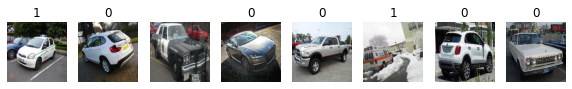

time: 380 ms


In [25]:
from matplotlib import pyplot as plt

to_pil = torchvision.transforms.ToPILImage()
images, labels = get_random_images(5)
fig=plt.figure(figsize=(10,10))
for ii in range(len(images)):
    image = to_pil(images[ii])
    index = predict_image(image)
    #print(index)
    sub = fig.add_subplot(1, len(images), ii+1)
    res = int(labels[ii]) == index
    if res:
        sub.set_title(index)
    else:
        print('Misclassified Image :\n\tActual Label : {} and predicted : {}'.format(int(labels[ii]),index))
    plt.axis('off')
    plt.imshow(image)
plt.show()

# Test model

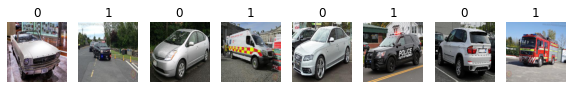

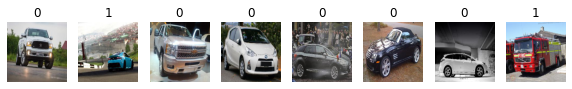

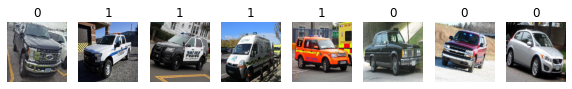

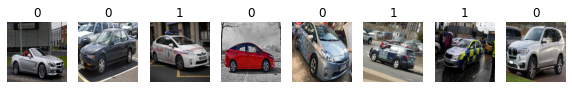

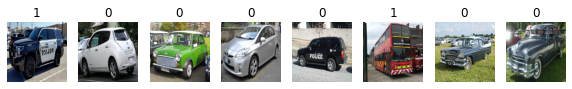

...

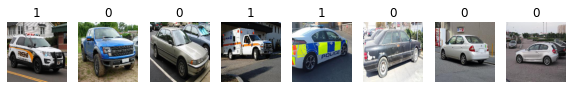

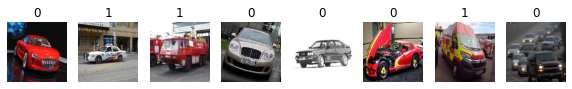

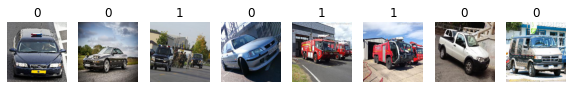

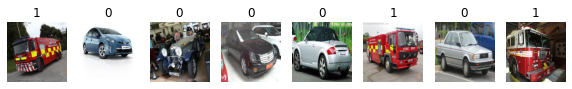

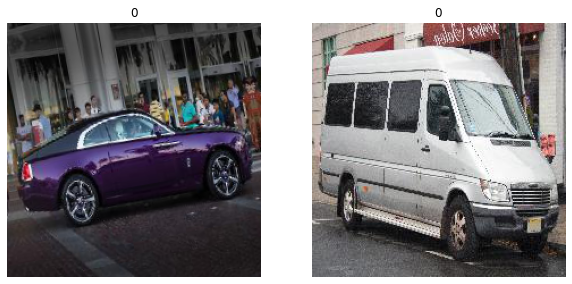


time: 5min 40s


In [26]:
from matplotlib import pyplot as plt
predClass = []

#for _ in np.arange(float(len(testDs))/8.0+1): 
data = iter(test_loader)
#for v in np.arange(float(len(testDs))/8.0+1): 
res = True
while res:
    try:
        images = data.next()
        res = False if len(images)==0 else True
    except Exception as e:
        print(str(e))
        break
    to_pil = torchvision.transforms.ToPILImage()


    fig=plt.figure(figsize=(10,10))
    for ii in range(len(images)):
        image = to_pil(images[ii])
        index = predict_image(image)
        predClass.append(index)
        sub = fig.add_subplot(1, len(images), ii+1)
        sub.set_title(index)
        plt.axis('off')
        plt.imshow(image)
    plt.show()

In [27]:
sample = pd.DataFrame(testDs.ds,columns=['image_names'])
sample['emergency_or_not'] = np.array(predClass)

time: 6.24 ms


In [28]:
sample.to_csv('sample_v8.csv',index=False)

time: 555 ms


In [29]:
sample

,image_names,emergency_or_not
0,1960.jpg,0
1,668.jpg,1
2,2082.jpg,0
3,808.jpg,1
4,1907.jpg,0
...,...,...
701,674.jpg,1
702,1027.jpg,0
703,447.jpg,1
704,2176.jpg,0


time: 28.1 ms
